In [167]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
import matplotlib.pyplot as plt
%matplotlib inline
import pandas_profiling as pp
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import StandardScaler
from sklearn.tree import  DecisionTreeClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import pickle
from sklearn.metrics import f1_score,accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.model_selection import KFold
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.optimizers import Adam
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings('ignore')

In [168]:
main=pd.read_csv(r"C:\Users\Vijay Rathod\Downloads\telecommunications_churn.csv",sep=";")
df2=main.copy()

In [169]:
df2.head()

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn
0,128,1,25,265.1,197.4,244.7,10.0,1,0,110,45.07,99,16.78,91,11.01,3,2.70,75.56,0
1,107,1,26,161.6,195.5,254.4,13.7,1,0,123,27.47,103,16.62,103,11.45,3,3.70,59.24,0
2,137,0,0,243.4,121.2,162.6,12.2,0,0,114,41.38,110,10.30,104,7.32,5,3.29,62.29,0
3,84,0,0,299.4,61.9,196.9,6.6,2,1,71,50.90,88,5.26,89,8.86,7,1.78,66.80,0
4,75,0,0,166.7,148.3,186.9,10.1,3,1,113,28.34,122,12.61,121,8.41,3,2.73,52.09,0


# EDA

In [170]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   account_length          3333 non-null   int64  
 1   voice_mail_plan         3333 non-null   int64  
 2   voice_mail_messages     3333 non-null   int64  
 3   day_mins                3333 non-null   float64
 4   evening_mins            3333 non-null   float64
 5   night_mins              3333 non-null   float64
 6   international_mins      3333 non-null   float64
 7   customer_service_calls  3333 non-null   int64  
 8   international_plan      3333 non-null   int64  
 9   day_calls               3333 non-null   int64  
 10  day_charge              3333 non-null   float64
 11  evening_calls           3333 non-null   int64  
 12  evening_charge          3333 non-null   float64
 13  night_calls             3333 non-null   int64  
 14  night_charge            3333 non-null   

In [171]:
# data types
df2.dtypes

account_length              int64
voice_mail_plan             int64
voice_mail_messages         int64
day_mins                  float64
evening_mins              float64
night_mins                float64
international_mins        float64
customer_service_calls      int64
international_plan          int64
day_calls                   int64
day_charge                float64
evening_calls               int64
evening_charge            float64
night_calls                 int64
night_charge              float64
international_calls         int64
international_charge      float64
total_charge              float64
churn                       int64
dtype: object

In [172]:
# change 'Class' data type to Categoric
df2['churn']=df2['churn'].astype('category')  

In [173]:
df2.describe()

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,0.276628,8.099010,179.775098,200.980348,200.872037,10.237294,1.562856,0.096910,100.435644,30.562307,100.114311,17.083540,100.107711,9.039325,4.479448,2.764581,59.449754
std,39.822106,0.447398,13.688365,54.467389,50.713844,50.573847,2.791840,1.315491,0.295879,20.069084,9.259435,19.922625,4.310668,19.568609,2.275873,2.461214,0.753773,10.502261
min,1.000000,0.000000,0.000000,0.000000,0.000000,23.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000,1.040000,0.000000,0.000000,22.930000
25%,74.000000,0.000000,0.000000,143.700000,166.600000,167.000000,8.500000,1.000000,0.000000,87.000000,24.430000,87.000000,14.160000,87.000000,7.520000,3.000000,2.300000,52.380000
50%,101.000000,0.000000,0.000000,179.400000,201.400000,201.200000,10.300000,1.000000,0.000000,101.000000,30.500000,100.000000,17.120000,100.000000,9.050000,4.000000,2.780000,59.470000
75%,127.000000,1.000000,20.000000,216.400000,235.300000,235.300000,12.100000,2.000000,0.000000,114.000000,36.790000,114.000000,20.000000,113.000000,10.590000,6.000000,3.270000,66.480000
max,243.000000,1.000000,51.000000,350.800000,363.700000,395.000000,20.000000,9.000000,1.000000,165.000000,59.640000,170.000000,30.910000,175.000000,17.770000,20.000000,5.400000,96.150000


In [174]:
df2[df2.duplicated()]

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge,churn


In [175]:
df2.isnull().sum()

account_length            0
voice_mail_plan           0
voice_mail_messages       0
day_mins                  0
evening_mins              0
night_mins                0
international_mins        0
customer_service_calls    0
international_plan        0
day_calls                 0
day_charge                0
evening_calls             0
evening_charge            0
night_calls               0
night_charge              0
international_calls       0
international_charge      0
total_charge              0
churn                     0
dtype: int64

## Histogram

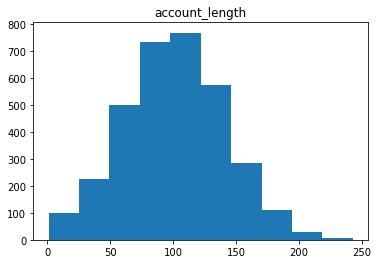

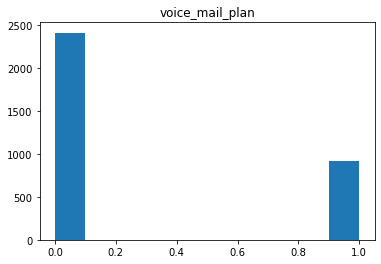

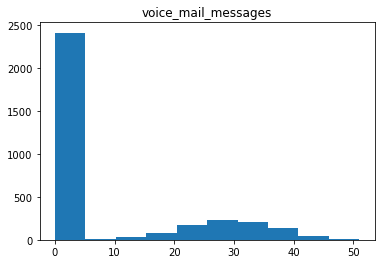

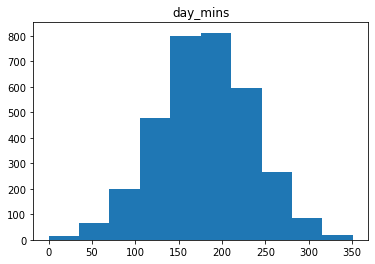

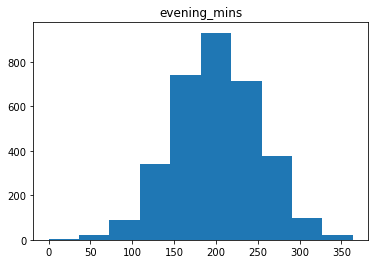

...

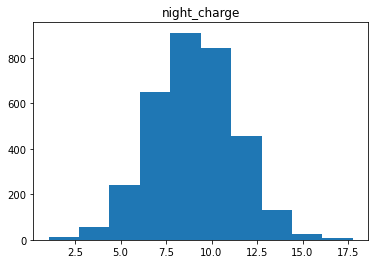

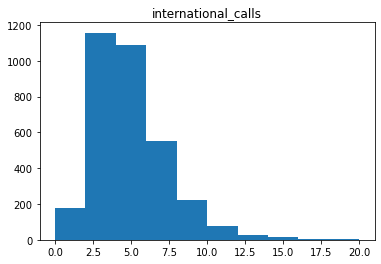

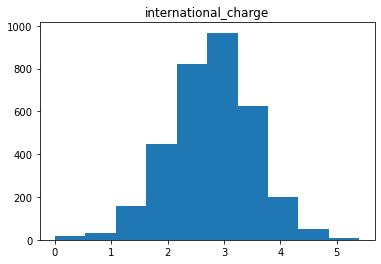

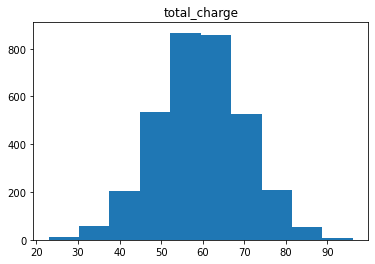

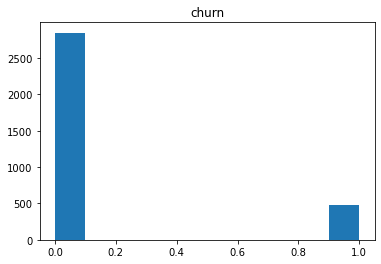

In [176]:
for i in df2.columns:
    plt.title(i)
    plt.hist(df2[i])
    plt.show()

## Checking For Outliers

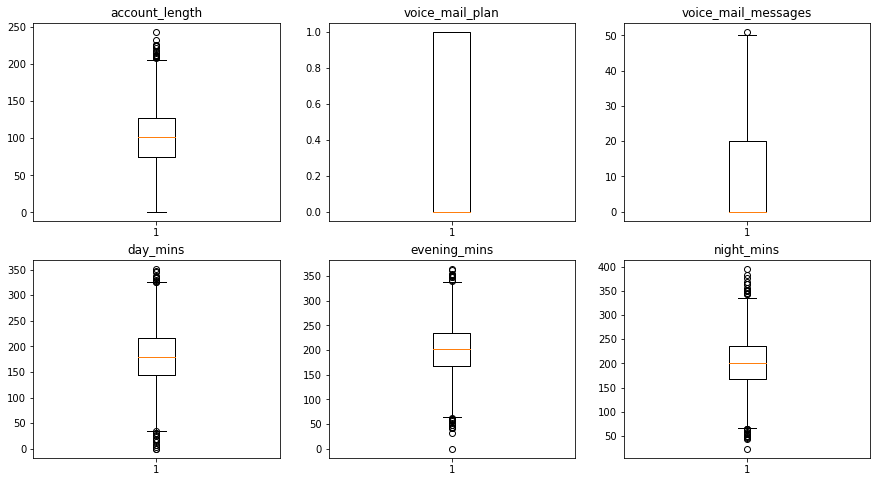

In [177]:
plt.figure(figsize=(15,8))
plt.subplot(2,3,1)
plt.boxplot(df2['account_length'])
plt.title("account_length")
plt.subplot(2,3,2)
plt.boxplot(df2['voice_mail_plan'])
plt.title("voice_mail_plan")
plt.subplot(2,3,3)
plt.boxplot(df2['voice_mail_messages'])
plt.title("voice_mail_messages")
plt.subplot(2,3,4)
plt.boxplot(df2['day_mins'])
plt.title("day_mins")
plt.subplot(2,3,5)
plt.boxplot(df2['evening_mins'])
plt.title("evening_mins")
plt.subplot(2,3,6)
plt.boxplot(df2['night_mins'])
plt.title("night_mins")
plt.show()

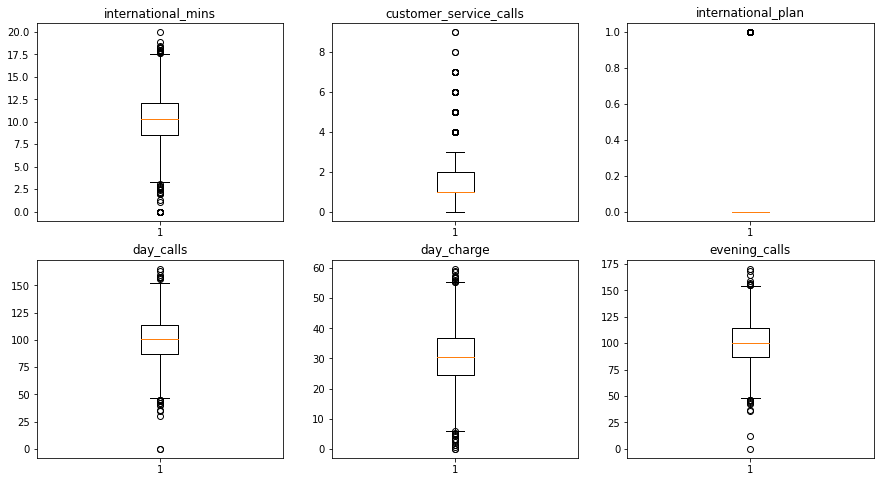

In [178]:
plt.figure(figsize=(15,8))
plt.subplot(2,3,1)
plt.boxplot(df2['international_mins'])
plt.title("international_mins")
plt.subplot(2,3,2)
plt.boxplot(df2['customer_service_calls'])
plt.title("customer_service_calls")
plt.subplot(2,3,3)
plt.boxplot(df2['international_plan'])
plt.title("international_plan")
plt.subplot(2,3,4)
plt.boxplot(df2['day_calls'])
plt.title("day_calls")
plt.subplot(2,3,5)
plt.boxplot(df2['day_charge'])
plt.title("day_charge")
plt.subplot(2,3,6)
plt.boxplot(df2['evening_calls'])
plt.title("evening_calls")
plt.show()

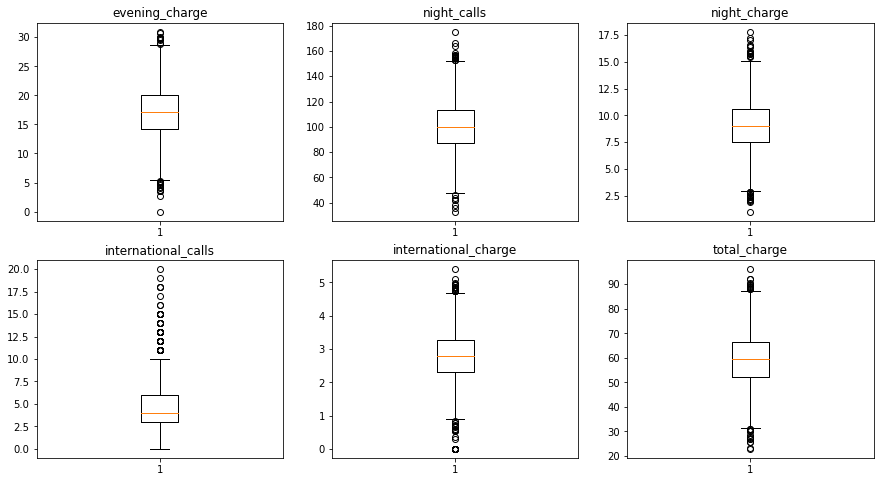

In [179]:
plt.figure(figsize=(15,8))
plt.subplot(2,3,1)
plt.boxplot(df2['evening_charge'])
plt.title("evening_charge")
plt.subplot(2,3,2)
plt.boxplot(df2['night_calls'])
plt.title("night_calls")
plt.subplot(2,3,3)
plt.boxplot(df2['night_charge'])
plt.title("night_charge")
plt.subplot(2,3,4)
plt.boxplot(df2['international_calls'])
plt.title("international_calls")
plt.subplot(2,3,5)
plt.boxplot(df2['international_charge'])
plt.title("international_charge")
plt.subplot(2,3,6)
plt.boxplot(df2['total_charge'])
plt.title("total_charge")
plt.show()

###  Imputing Outliers

In [180]:
df3=df2.copy()

In [181]:
upper_limit_1 = df2['account_length'].quantile(0.99)
lower_limit_1= df2['account_length'].quantile(0.01)


df3['account_length'] = np.where(df3['account_length'] >= upper_limit_1,
        upper_limit_1,
        np.where(df3['account_length'] <= lower_limit_1,
        lower_limit_1,
        df3['account_length']))

In [182]:
upper_limit_2 = df3['voice_mail_messages'].quantile(0.99)
lower_limit_2= df3['voice_mail_messages'].quantile(0.01)


df3['voice_mail_messages'] = np.where(df3['voice_mail_messages'] >= upper_limit_2,
        upper_limit_2,
        np.where(df3['voice_mail_messages'] <= lower_limit_2,
        lower_limit_2,
        df3['voice_mail_messages']))

In [183]:
upper_limit_3 = df3['day_mins'].quantile(0.99)
lower_limit_3= df3['day_mins'].quantile(0.01)

df3['day_mins'] = np.where(df3['day_mins'] >= upper_limit_3,
        upper_limit_3,
        np.where(df3['day_mins'] <= lower_limit_3,
        lower_limit_3,
        df3['day_mins']))

In [184]:
upper_limit_4 = df3['evening_mins'].quantile(0.99)
lower_limit_4= df3['evening_mins'].quantile(0.01)

df3['evening_mins'] = np.where(df3['evening_mins'] >= upper_limit_4,
        upper_limit_4,
        np.where(df3['evening_mins'] <= lower_limit_4,
        lower_limit_4,
        df3['evening_mins']))

In [185]:
upper_limit_5 = df3['night_mins'].quantile(0.99)
lower_limit_5= df3['night_mins'].quantile(0.01)


df3['night_mins'] = np.where(df3['night_mins'] >= upper_limit_5,
        upper_limit_5,
        np.where(df3['night_mins'] <= lower_limit_5,
        lower_limit_5,
        df3['night_mins']))

In [186]:
upper_limit_6 = df3['international_mins'].quantile(0.99)
lower_limit_6= df3['international_mins'].quantile(0.01)


df3['international_mins'] = np.where(df3['international_mins'] >= upper_limit_6,
        upper_limit_6,
        np.where(df3['international_mins'] <= lower_limit_6,
        lower_limit_6,
        df3['international_mins']))

In [187]:
upper_limit_7 = df3['customer_service_calls'].quantile(0.99)
lower_limit_7= df3['customer_service_calls'].quantile(0.01)


df3['customer_service_calls'] = np.where(df2['customer_service_calls'] >= upper_limit_7,
        upper_limit_7,
        np.where(df3['customer_service_calls'] <= lower_limit_7,
        lower_limit_7,
        df3['customer_service_calls']))

In [188]:
upper_limit_8 = df3['day_calls'].quantile(0.99)
lower_limit_8= df3['day_calls'].quantile(0.01)


df3['day_calls'] = np.where(df3['day_calls'] >= upper_limit_8,
        upper_limit_8,
        np.where(df3['day_calls'] <= lower_limit_8,
        lower_limit_8,
        df3['day_calls']))

In [189]:
upper_limit_9 = df3['day_charge'].quantile(0.99)
lower_limit_9= df3['day_charge'].quantile(0.01)


df3['day_charge'] = np.where(df3['day_charge'] >= upper_limit_9,
        upper_limit_9,
        np.where(df3['day_charge'] <= lower_limit_9,
        lower_limit_9,
        df3['day_charge']))

In [190]:
upper_limit_10 = df3['evening_calls'].quantile(0.99)
lower_limit_10= df3['evening_calls'].quantile(0.01)


df3['evening_calls'] = np.where(df3['evening_calls'] >= upper_limit_10,
        upper_limit_10,
        np.where(df3['evening_calls'] <= lower_limit_10,
        lower_limit_10,
        df3['evening_calls']))

In [191]:
upper_limit_11 = df3['evening_charge'].quantile(0.99)
lower_limit_11= df3['evening_charge'].quantile(0.01)


df3['evening_charge'] = np.where(df3['evening_charge'] >= upper_limit_11,
        upper_limit_11,
        np.where(df3['evening_charge'] <= lower_limit_11,
        lower_limit_11,
        df3['evening_charge']))

In [192]:
upper_limit_12= df3['night_calls'].quantile(0.99)
lower_limit_12= df3['night_calls'].quantile(0.01)


df3['night_calls'] = np.where(df3['night_calls'] >= upper_limit_12,
        upper_limit_12,
        np.where(df3['night_calls'] <= lower_limit_12,
        lower_limit_12,
        df3['night_calls']))

In [193]:
upper_limit_13 = df3['night_charge'].quantile(0.99)
lower_limit_13= df3['night_charge'].quantile(0.01)


df3['night_charge'] = np.where(df3['night_charge'] >= upper_limit_13,
        upper_limit_13,
        np.where(df3['night_charge'] <= lower_limit_13,
        lower_limit_13,
        df3['night_charge']))

In [194]:
upper_limit_14 = df3['international_calls'].quantile(0.99)
lower_limit_14= df3['international_calls'].quantile(0.01)


df3['international_calls'] = np.where(df3['international_calls'] >= upper_limit_14,
        upper_limit_14,
        np.where(df3['international_calls'] <= lower_limit_14,
        lower_limit_14,
        df3['international_calls']))

In [195]:
upper_limit_15 = df3['international_charge'].quantile(0.99)
lower_limit_15= df3['international_charge'].quantile(0.01)


df3['international_charge'] = np.where(df3['international_charge'] >= upper_limit_15,
        upper_limit_15,
        np.where(df3['international_charge'] <= lower_limit_15,
        lower_limit_15,
        df3['international_charge']))

In [196]:
upper_limit_16 = df3['total_charge'].quantile(0.99)
lower_limit_16= df3['total_charge'].quantile(0.01)

df3['total_charge'] = np.where(df3['total_charge'] >= upper_limit_16,
        upper_limit_16,
        np.where(df3['total_charge'] <= lower_limit_16,
        lower_limit_16,
        df3['total_charge']))

## Box plot after Outlier Removal

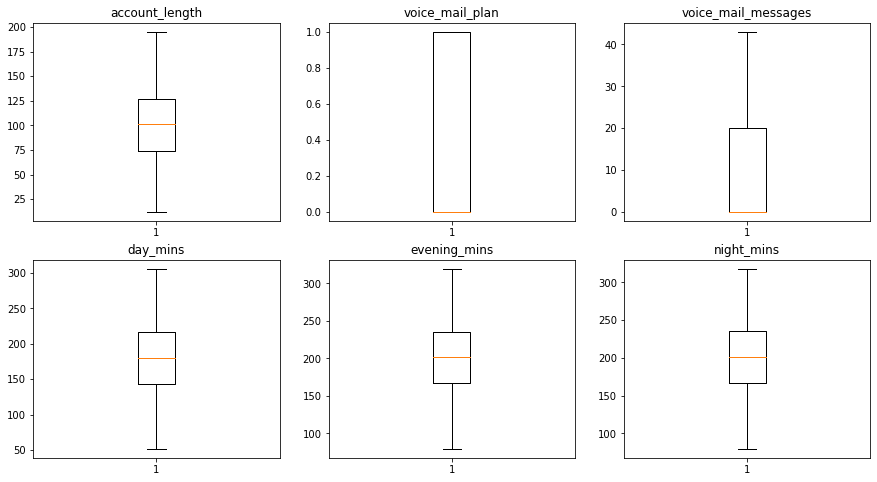

In [197]:
plt.figure(figsize=(15,8))
plt.subplot(2,3,1)
plt.boxplot(df3['account_length'])
plt.title("account_length")
plt.subplot(2,3,2)
plt.boxplot(df3['voice_mail_plan'])
plt.title("voice_mail_plan")
plt.subplot(2,3,3)
plt.boxplot(df3['voice_mail_messages'])
plt.title("voice_mail_messages")
plt.subplot(2,3,4)
plt.boxplot(df3['day_mins'])
plt.title("day_mins")
plt.subplot(2,3,5)
plt.boxplot(df3['evening_mins'])
plt.title("evening_mins")
plt.subplot(2,3,6)
plt.boxplot(df3['night_mins'])
plt.title("night_mins")
plt.show()

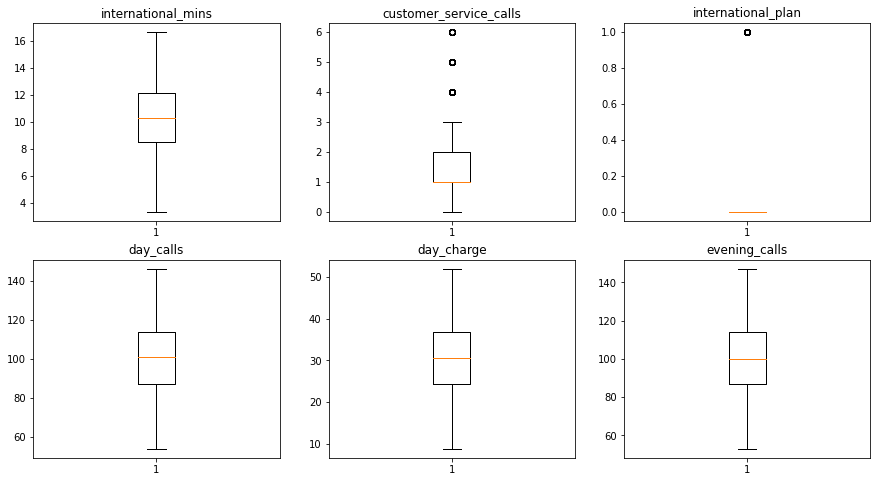

In [198]:
plt.figure(figsize=(15,8))
plt.subplot(2,3,1)
plt.boxplot(df3['international_mins'])
plt.title("international_mins")
plt.subplot(2,3,2)
plt.boxplot(df3['customer_service_calls'])
plt.title("customer_service_calls")
plt.subplot(2,3,3)
plt.boxplot(df3['international_plan'])
plt.title("international_plan")
plt.subplot(2,3,4)
plt.boxplot(df3['day_calls'])
plt.title("day_calls")
plt.subplot(2,3,5)
plt.boxplot(df3['day_charge'])
plt.title("day_charge")
plt.subplot(2,3,6)
plt.boxplot(df3['evening_calls'])
plt.title("evening_calls")
plt.show()

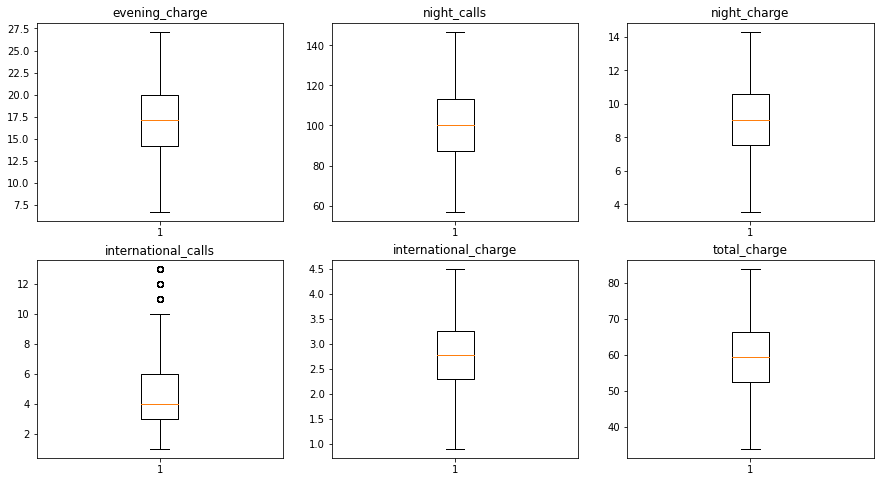

In [199]:
plt.figure(figsize=(15,8))
plt.subplot(2,3,1)
plt.boxplot(df3['evening_charge'])
plt.title("evening_charge")
plt.subplot(2,3,2)
plt.boxplot(df3['night_calls'])
plt.title("night_calls")
plt.subplot(2,3,3)
plt.boxplot(df3['night_charge'])
plt.title("night_charge")
plt.subplot(2,3,4)
plt.boxplot(df3['international_calls'])
plt.title("international_calls")
plt.subplot(2,3,5)
plt.boxplot(df3['international_charge'])
plt.title("international_charge")
plt.subplot(2,3,6)
plt.boxplot(df3['total_charge'])
plt.title("total_charge")
plt.show()

## Automated EDA

In [83]:
EDA_report= pp.ProfileReport(df2)
EDA_report.to_file(output_file='report')
EDA_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Feature Engineering

In [200]:
##Feature Importance using Decision Tree
from sklearn.tree import  DecisionTreeClassifier
X = df3.iloc[:,0:18]
Y = df3.iloc[:,18]
# feature extraction
model = DecisionTreeClassifier()
model.fit(X, Y)
print(model.feature_importances_)

[0.00805857 0.00322836 0.11733358 0.00839721 0.01414346 0.00816597
 0.08891862 0.11394695 0.06863972 0.0140718  0.0127139  0.01240654
 0.0025387  0.00885999 0.00768106 0.07501572 0.0147908  0.42108904]


In [201]:
# Feature Extraction with RFE
from sklearn.feature_selection import RFE
from sklearn.svm import SVR
X=df3.iloc[:,0:18]
Y=df3.iloc[:,18]
model =DecisionTreeClassifier()
selector = RFE(model, n_features_to_select=13, step=1)
selector = selector.fit(X, Y)
print(selector.support_)
print(selector.ranking_)

[ True False  True  True False  True False  True  True  True False  True
  True  True False  True  True  True]
[1 5 1 1 4 1 2 1 1 1 3 1 1 1 6 1 1 1]


## Correlation

In [202]:
plt.figure(figsize=(15,7))
corr_matrix=df2.corr()
corr_matrix

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,day_charge,evening_calls,evening_charge,night_calls,night_charge,international_calls,international_charge,total_charge
account_length,1.000000,0.002918,-0.004628,0.006216,-0.006757,-0.008955,0.009514,-0.003796,0.024735,0.038470,0.006214,0.019260,-0.006745,-0.013176,-0.008960,0.020661,0.009546,0.001454
voice_mail_plan,0.002918,1.000000,0.956927,-0.001684,0.021545,0.006079,-0.001318,-0.017824,0.006006,-0.011086,-0.001686,-0.006444,0.021559,0.015553,0.006064,0.007618,-0.001276,0.008585
voice_mail_messages,-0.004628,0.956927,1.000000,0.000778,0.017562,0.007681,0.002856,-0.013263,0.008745,-0.009548,0.000776,-0.005864,0.017578,0.007123,0.007663,0.013957,0.002884,0.009766
day_mins,0.006216,-0.001684,0.000778,1.000000,0.007043,0.004323,-0.010155,-0.013423,0.049396,0.006750,1.000000,0.015769,0.007029,0.022972,0.004300,0.008033,-0.010092,0.884754
evening_mins,-0.006757,0.021545,0.017562,0.007043,1.000000,-0.012584,-0.011035,-0.012985,0.019100,-0.021451,0.007050,-0.011430,1.000000,0.007586,-0.012593,0.002541,-0.011067,0.413143
night_mins,-0.008955,0.006079,0.007681,0.004323,-0.012584,1.000000,-0.015207,-0.009288,-0.028905,0.022938,0.004324,-0.002093,-0.012592,0.011204,0.999999,-0.012353,-0.015180,0.214257
international_mins,0.009514,-0.001318,0.002856,-0.010155,-0.011035,-0.015207,1.000000,-0.009640,0.045871,0.021565,-0.010157,0.008703,-0.011043,-0.013605,-0.015214,0.032304,0.999993,0.054988
customer_service_calls,-0.003796,-0.017824,-0.013263,-0.013423,-0.012985,-0.009288,-0.009640,1.000000,-0.024522,-0.018942,-0.013427,0.002423,-0.012987,-0.012802,-0.009277,-0.017561,-0.009675,-0.019873
international_plan,0.024735,0.006006,0.008745,0.049396,0.019100,-0.028905,0.045871,-0.024522,1.000000,0.003755,0.049398,0.006114,0.019106,0.012451,-0.028913,0.017366,0.045780,0.048415
day_calls,0.038470,-0.011086,-0.009548,0.006750,-0.021451,0.022938,0.021565,-0.018942,0.003755,1.000000,0.006753,0.006462,-0.021449,-0.019557,0.022927,0.004574,0.021666,0.003673


<Figure size 1080x504 with 0 Axes>

## Heat Map

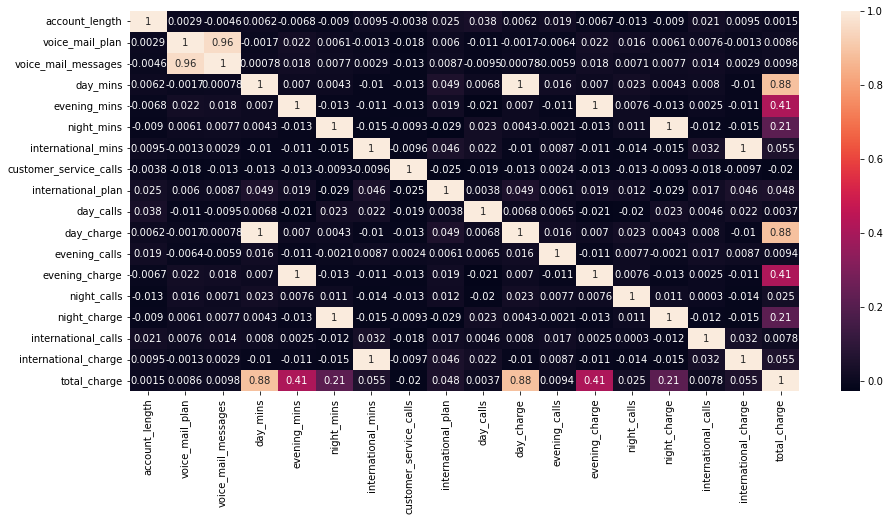

In [203]:
plt.figure(figsize=(15,7))
sns.heatmap(corr_matrix,annot=True)
plt.show()

### Droping variables

In [204]:
#deleted these variables as they are 100% related(from corelation matrix) 
df3.drop(labels=['night_charge','evening_charge','day_charge','international_charge'], axis=1, inplace=True)
df3

,account_length,voice_mail_plan,voice_mail_messages,day_mins,evening_mins,night_mins,international_mins,customer_service_calls,international_plan,day_calls,evening_calls,night_calls,international_calls,total_charge,churn
0,128.0,1,25.0,265.1,197.400,244.7,10.0,1.0,0,110.0,99.0,91.0,3.0,75.56,0
1,107.0,1,26.0,161.6,195.500,254.4,13.7,1.0,0,123.0,103.0,103.0,3.0,59.24,0
2,137.0,0,0.0,243.4,121.200,162.6,12.2,0.0,0,114.0,110.0,104.0,5.0,62.29,0
3,84.0,0,0.0,299.4,79.524,196.9,6.6,2.0,1,71.0,88.0,89.0,7.0,66.80,0
4,75.0,0,0.0,166.7,148.300,186.9,10.1,3.0,1,113.0,122.0,121.0,3.0,52.09,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,1,36.0,156.2,215.500,279.1,9.9,2.0,0,77.0,126.0,83.0,6.0,60.10,0
3329,68.0,0,0.0,231.1,153.400,191.3,9.6,3.0,0,57.0,55.0,123.0,4.0,63.53,0
3330,28.0,0,0.0,180.8,288.800,191.9,14.1,2.0,0,109.0,58.0,91.0,6.0,67.74,0
3331,184.0,0,0.0,213.8,159.600,139.2,5.0,2.0,1,105.0,84.0,137.0,10.0,57.53,0


In [205]:
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return(vif)

In [206]:
X  = df3.iloc[:,:-1]
print(X.shape)
y = df3[['churn']]
print(y.shape)

(3333, 14)
(3333, 1)


In [207]:
df_vif = calc_vif(X)
df_vif.sort_values(by='VIF', ascending=False)

,variables,VIF
13,total_charge,11771.999537
3,day_mins,3292.097404
4,evening_mins,1019.532379
5,night_mins,296.848705
6,international_mins,41.390899
11,night_calls,23.073353
10,evening_calls,22.828759
9,day_calls,22.751455
1,voice_mail_plan,17.139957
2,voice_mail_messages,16.751280


In [209]:
#deleting day_mins as it has 88% correlation with total charge
df3.drop(labels=['day_mins','evening_mins'], axis=1, inplace=True)
df3

,account_length,voice_mail_plan,voice_mail_messages,night_mins,international_mins,customer_service_calls,international_plan,day_calls,evening_calls,night_calls,international_calls,total_charge,churn
0,128.0,1,25.0,244.7,10.0,1.0,0,110.0,99.0,91.0,3.0,75.56,0
1,107.0,1,26.0,254.4,13.7,1.0,0,123.0,103.0,103.0,3.0,59.24,0
2,137.0,0,0.0,162.6,12.2,0.0,0,114.0,110.0,104.0,5.0,62.29,0
3,84.0,0,0.0,196.9,6.6,2.0,1,71.0,88.0,89.0,7.0,66.80,0
4,75.0,0,0.0,186.9,10.1,3.0,1,113.0,122.0,121.0,3.0,52.09,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,1,36.0,279.1,9.9,2.0,0,77.0,126.0,83.0,6.0,60.10,0
3329,68.0,0,0.0,191.3,9.6,3.0,0,57.0,55.0,123.0,4.0,63.53,0
3330,28.0,0,0.0,191.9,14.1,2.0,0,109.0,58.0,91.0,6.0,67.74,0
3331,184.0,0,0.0,139.2,5.0,2.0,1,105.0,84.0,137.0,10.0,57.53,0


In [210]:
final_data= df3
final_data

,account_length,voice_mail_plan,voice_mail_messages,night_mins,international_mins,customer_service_calls,international_plan,day_calls,evening_calls,night_calls,international_calls,total_charge,churn
0,128.0,1,25.0,244.7,10.0,1.0,0,110.0,99.0,91.0,3.0,75.56,0
1,107.0,1,26.0,254.4,13.7,1.0,0,123.0,103.0,103.0,3.0,59.24,0
2,137.0,0,0.0,162.6,12.2,0.0,0,114.0,110.0,104.0,5.0,62.29,0
3,84.0,0,0.0,196.9,6.6,2.0,1,71.0,88.0,89.0,7.0,66.80,0
4,75.0,0,0.0,186.9,10.1,3.0,1,113.0,122.0,121.0,3.0,52.09,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,1,36.0,279.1,9.9,2.0,0,77.0,126.0,83.0,6.0,60.10,0
3329,68.0,0,0.0,191.3,9.6,3.0,0,57.0,55.0,123.0,4.0,63.53,0
3330,28.0,0,0.0,191.9,14.1,2.0,0,109.0,58.0,91.0,6.0,67.74,0
3331,184.0,0,0.0,139.2,5.0,2.0,1,105.0,84.0,137.0,10.0,57.53,0


### Checking The Balance of data

0    2850
1     483
Name: churn, dtype: int64


<AxesSubplot:xlabel='churn', ylabel='count'>

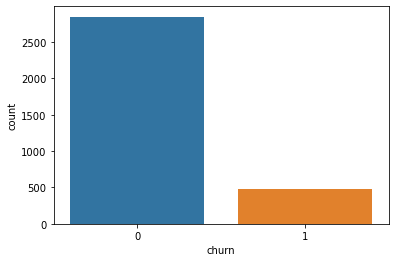

In [211]:
print(final_data['churn'].value_counts())
sns.countplot(final_data['churn'])

In [297]:
X=final_data.iloc[:,0:12]
Y=final_data.iloc[:,12]

# Balancing the data set

###  SMOTE

In [298]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(sampling_strategy='minority')
x_sm,y_sm= smote.fit_resample(X,Y)
y_sm.value_counts()

0    2850
1    2850
Name: churn, dtype: int64

In [299]:
X_train,X_test,y_train,y_test=train_test_split(x_sm,y_sm,test_size=0.25,random_state=15,stratify=y_sm)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(4275, 12)
(1425, 12)
(4275,)
(1425,)


# Model Building

## KNN

In [300]:
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn import metrics

### Tunning the Parameter

In [228]:
n_neighbors=np.array(range(1,40))
param_grid=dict(n_neighbors=n_neighbors)
model=KNeighborsClassifier()
grid=GridSearchCV(estimator=model,param_grid=param_grid)
grid.fit(X_train,y_train)
print(grid.best_score_)
print(grid.best_params_)

0.8774269005847953
{'n_neighbors': 2}


In [229]:
KNN_model1 = KNeighborsClassifier(n_neighbors=2)
KNN_model1.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=2)

Training Accuracy =  0.9906432748538012
Testing Accuracy =  0.8996491228070176
F1 score =  0.9042196918955123
              precision    recall  f1-score   support

           0       0.94      0.85      0.89       713
           1       0.86      0.95      0.90       712

    accuracy                           0.90      1425
   macro avg       0.90      0.90      0.90      1425
weighted avg       0.90      0.90      0.90      1425

Root Mean Squared Error =  0.31678206576916956


Text(33.0, 0.5, 'Actual')

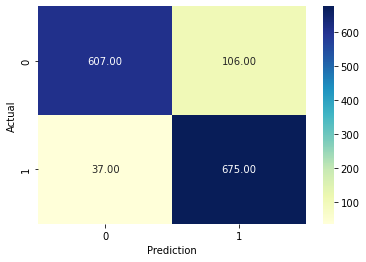

In [230]:
y_pred_train_knn= KNN_model1.predict(X_train)
y_pred_knn= KNN_model1.predict(X_test)
KNN_R1=accuracy_score(y_train,y_pred_train_knn) 
KNN_R2=accuracy_score(y_test,y_pred_knn)
KNN_rmse=np.sqrt(mean_squared_error(y_test,y_pred_knn))
f1_knn=metrics.f1_score(y_test,y_pred_knn)
print("Training Accuracy = ",KNN_R1)
print("Testing Accuracy = ",KNN_R2)
print("F1 score = ",f1_knn)
print(classification_report(y_test,y_pred_knn))
print("Root Mean Squared Error = ",KNN_rmse)
sns.heatmap(confusion_matrix(y_test,y_pred_knn), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

## AdaBoost

In [231]:
from sklearn.ensemble import AdaBoostClassifier

### Tunning the Parameter

In [232]:
ada_boost=AdaBoostClassifier()
grid_params= {'n_estimators': [100,200,300]}
objectgrid_object = GridSearchCV(estimator= ada_boost, param_grid = grid_params, scoring = 'accuracy', cv = 3, n_jobs = -1)
objectgrid_object.fit(X_train,y_train)
print(objectgrid_object.best_params_)
print(objectgrid_object.best_score_)

{'n_estimators': 200}
0.9295906432748539


In [233]:
Ada_model=AdaBoostClassifier(n_estimators=200)
Ada_model.fit(X_train,y_train)

AdaBoostClassifier(n_estimators=200)

Training Accuracy =  0.9426900584795321
Testing Accuracy =  0.9382456140350878
F1 score =  0.9373219373219372
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       713
           1       0.95      0.92      0.94       712

    accuracy                           0.94      1425
   macro avg       0.94      0.94      0.94      1425
weighted avg       0.94      0.94      0.94      1425

Root Mean Squared Error =  0.24850429767895824


Text(33.0, 0.5, 'Actual')

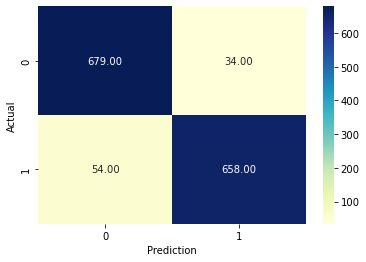

In [234]:
y_pred_train_ada= Ada_model.predict(X_train)
y_pred_ada= Ada_model.predict(X_test)
ada_R1=accuracy_score(y_train,y_pred_train_ada) 
ada_R2=accuracy_score(y_test,y_pred_ada)
ada_rmse=np.sqrt(mean_squared_error(y_test,y_pred_ada))
f1_ada=metrics.f1_score(y_test,y_pred_ada)
print("Training Accuracy = ",ada_R1)
print("Testing Accuracy = ",ada_R2)
print("F1 score = ",f1_ada)
print(classification_report(y_test,y_pred_ada))
print("Root Mean Squared Error = ",ada_rmse)
sns.heatmap(confusion_matrix(y_test,y_pred_ada), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

## Random Forest

In [235]:
from sklearn.ensemble import RandomForestClassifier

### Tunning the Parameter

In [236]:
rf_model = RandomForestClassifier(random_state=42)
rf_model= GridSearchCV(estimator= rf_model, param_grid = { 'criterion' : ["gini", "entropy"],'max_depth' :[2,3,4,5,6,7], 'n_estimators':[50,80,100,120,150], 'min_samples_split' : [2,3,4,5] })
rf_model.fit(X_train,y_train)
print(rf_model.best_params_)
print(rf_model.best_score_)

{'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 4, 'n_estimators': 50}
0.8818713450292398


In [237]:
Random_model=RandomForestClassifier(n_estimators=50, max_depth= 7, criterion='gini', min_samples_split=4)
Random_model.fit(X_train,y_train)

RandomForestClassifier(max_depth=7, min_samples_split=4, n_estimators=50)

Training Accuracy =  0.9108771929824562
Testing Accuracy =  0.888421052631579
F1 score =  0.8785332314744079
              precision    recall  f1-score   support

           0       0.83      0.97      0.90       713
           1       0.96      0.81      0.88       712

    accuracy                           0.89      1425
   macro avg       0.90      0.89      0.89      1425
weighted avg       0.90      0.89      0.89      1425

Root Mean Squared Error =  0.33403435058152486


Text(33.0, 0.5, 'Actual')

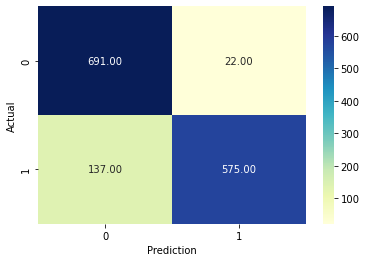

In [238]:
y_pred_train_rf= Random_model.predict(X_train)
y_pred_rf= Random_model.predict(X_test)
rf_R1=accuracy_score(y_train,y_pred_train_rf) 
rf_R2=accuracy_score(y_test,y_pred_rf)
rf_rmse=np.sqrt(mean_squared_error(y_test,y_pred_rf))
f1_rf=metrics.f1_score(y_test,y_pred_rf)
print("Training Accuracy = ",rf_R1)
print("Testing Accuracy = ",rf_R2)
print("F1 score = ",f1_rf)
print(classification_report(y_test,y_pred_rf))
print("Root Mean Squared Error = ",rf_rmse)
sns.heatmap(confusion_matrix(y_test,y_pred_rf), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

## Bagging 

In [239]:
from sklearn.ensemble import BaggingClassifier
from sklearn import tree

### Tunning the Parameter

In [240]:
bagg=BaggingClassifier()
n_estimators = [100, 300, 500, 800, 1200]
max_samples = [5, 10, 25, 50, 100]
max_features = [1, 2, 5, 10, 13]
hyperbag = dict(n_estimators = n_estimators, max_samples = max_samples,max_features = max_features)

gridbag = GridSearchCV(bagg, hyperbag, cv = 3, verbose = 1, n_jobs = -1)
gridbag.fit(X_train, y_train)

print(gridbag.best_params_)
print(gridbag.best_score_)

Fitting 3 folds for each of 125 candidates, totalling 375 fits
{'max_features': 2, 'max_samples': 100, 'n_estimators': 1200}
0.9043274853801169


In [241]:
Bagging_model=BaggingClassifier(max_features=5, max_samples=100,n_estimators=800)
Bagging_model.fit(X_train,y_train)

BaggingClassifier(max_features=5, max_samples=100, n_estimators=800)

Training Accuracy =  0.9085380116959064
Testing Accuracy =  0.895438596491228
F1 score =  0.8883895131086142
              precision    recall  f1-score   support

           0       0.85      0.96      0.90       713
           1       0.95      0.83      0.89       712

    accuracy                           0.90      1425
   macro avg       0.90      0.90      0.90      1425
weighted avg       0.90      0.90      0.90      1425

Root Mean Squared Error =  0.32335955762706614


Text(33.0, 0.5, 'Actual')

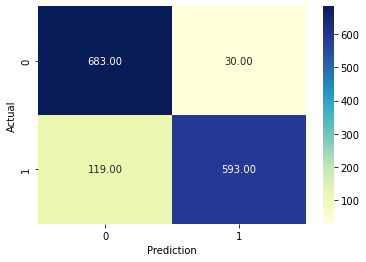

In [242]:
y_pred_train_bm=Bagging_model.predict(X_train)
y_pred_bm= Bagging_model.predict(X_test)
bm_R1=accuracy_score(y_train,y_pred_train_bm) 
bm_R2=accuracy_score(y_test,y_pred_bm)
bm_rmse=np.sqrt(mean_squared_error(y_test,y_pred_bm))
f1_bm=metrics.f1_score(y_test,y_pred_bm)
print("Training Accuracy = ",bm_R1)
print("Testing Accuracy = ",bm_R2)
print("F1 score = ",f1_bm)
print(classification_report(y_test,y_pred_bm))
print("Root Mean Squared Error = ",bm_rmse)
sns.heatmap(confusion_matrix(y_test,y_pred_bm), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

##  Decision Tree

In [243]:
from sklearn.tree import DecisionTreeClassifier

### Tunning the Parameter

In [244]:
dt_model = DecisionTreeClassifier(random_state=52)
dt_model_gv = GridSearchCV(estimator= dt_model, param_grid = { 'criterion' : ["gini", "entropy"],'max_depth' :[2,3,4,5,6,7],'min_samples_split' : [2,3,4,5] })
dt_model_gv.fit(X_train,y_train)
print(dt_model_gv.best_params_)
print(dt_model_gv.best_score_)

{'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 4}
0.927953216374269


In [245]:
model_tree=DecisionTreeClassifier(max_depth= 7, criterion ='gini', min_samples_split=4,random_state= 50)
model_tree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=7, min_samples_split=4, random_state=50)

Training Accuracy =  0.928654970760234
Testing Accuracy =  0.9207017543859649
F1 score =  0.9151014274981217
              precision    recall  f1-score   support

           0       0.87      0.99      0.93       713
           1       0.98      0.86      0.92       712

    accuracy                           0.92      1425
   macro avg       0.93      0.92      0.92      1425
weighted avg       0.93      0.92      0.92      1425

Root Mean Squared Error =  0.2815994417857306


Text(33.0, 0.5, 'Actual')

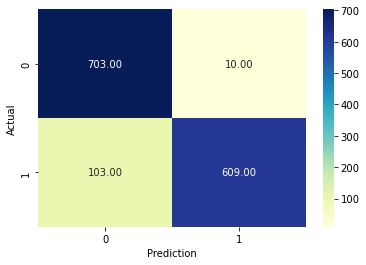

In [246]:
y_pred_train_dt=model_tree.predict(X_train)
y_pred_dt= model_tree.predict(X_test)
dt_R1=accuracy_score(y_train,y_pred_train_dt) 
dt_R2=accuracy_score(y_test,y_pred_dt)
dt_rmse=np.sqrt(mean_squared_error(y_test,y_pred_dt))
f1_dt=metrics.f1_score(y_test,y_pred_dt)
print("Training Accuracy = ",dt_R1)
print("Testing Accuracy = ",dt_R2)
print("F1 score = ",f1_dt)
print(classification_report(y_test,y_pred_dt))
print("Root Mean Squared Error = ",dt_rmse)
sns.heatmap(confusion_matrix(y_test,y_pred_dt), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

##  XGB

In [301]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

### Tunning the Parameter

In [307]:
parameters = {'nthread':[4],'learning_rate': [0.1,0.2,0.3,0.4,0.5],'max_depth': [3,4,5,6,7,8],'n_estimators': [100, 150,200]}
model_xgb = XGBClassifier()
model_xgb= GridSearchCV(estimator= model_xgb, param_grid= parameters)
model_xgb.fit(X_train,y_train)
print(model_xgb.best_params_)
print(model_xgb.best_score_)

{'learning_rate': 0.3, 'max_depth': 6, 'n_estimators': 100, 'nthread': 4}
0.9791812865497077


In [302]:
model_xgb=XGBClassifier(n_estimators=200, max_depth= 4, learning_rate=0.5,  nthread = 4)
model_xgb.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.5, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=4, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=200,
              n_jobs=4, nthread=4, num_parallel_tree=1, predictor='auto',
              random_state=0, reg_alpha=0, ...)

Training Accuracy =  1.0
Testing Accuracy =  0.9796491228070175
F1 score =  0.9793300071275837
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       713
           1       0.99      0.96      0.98       712

    accuracy                           0.98      1425
   macro avg       0.98      0.98      0.98      1425
weighted avg       0.98      0.98      0.98      1425

Root Mean Squared Error =  0.14265650070355174


Text(33.0, 0.5, 'Actual')

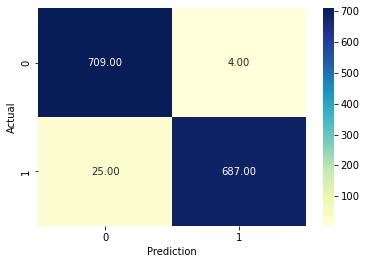

In [303]:
y_pred_train_xgb=model_xgb.predict(X_train)
y_pred_xgb= model_xgb.predict(X_test)
xgb_R1=accuracy_score(y_train,y_pred_train_xgb) 
xgb_R2=accuracy_score(y_test,y_pred_xgb)
xgb_rmse=np.sqrt(mean_squared_error(y_test,y_pred_xgb))
f1_xgb=metrics.f1_score(y_test,y_pred_xgb)
print("Training Accuracy = ",xgb_R1)
print("Testing Accuracy = ",xgb_R2)
print("F1 score = ",f1_xgb)
print(classification_report(y_test,y_pred_xgb))
print("Root Mean Squared Error = ",xgb_rmse)
sns.heatmap(confusion_matrix(y_test,y_pred_xgb), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

In [304]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   account_length          3333 non-null   float64 
 1   voice_mail_plan         3333 non-null   int64   
 2   voice_mail_messages     3333 non-null   float64 
 3   night_mins              3333 non-null   float64 
 4   international_mins      3333 non-null   float64 
 5   customer_service_calls  3333 non-null   float64 
 6   international_plan      3333 non-null   int64   
 7   day_calls               3333 non-null   float64 
 8   evening_calls           3333 non-null   float64 
 9   night_calls             3333 non-null   float64 
 10  international_calls     3333 non-null   float64 
 11  total_charge            3333 non-null   float64 
 12  churn                   3333 non-null   category
dtypes: category(1), float64(10), int64(2)
memory usage: 316.0 KB


In [305]:
new_data=pd.DataFrame({"account_length":68,"voice_mail_plan":0,"voice_mail_messages":0,"night_mins":191.3,"international_mins":9.6,"customer_service_calls":3,"international_plan":0,"day_calls":57,"evening_calls":55,"night_calls":123,"international_calls":4,"total_charge":63.53},index=[0])
new_data

,account_length,voice_mail_plan,voice_mail_messages,night_mins,international_mins,customer_service_calls,international_plan,day_calls,evening_calls,night_calls,international_calls,total_charge
0,68,0,0,191.3,9.6,3,0,57,55,123,4,63.53


In [306]:
model_xgb.predict(new_data)

array([0])

## Logistic Regression

In [254]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures

In [255]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier.fit(X_train,y_train)

LogisticRegression()

Training Accuracy =  0.7164912280701754
Testing Accuracy =  0.7143859649122807
F1 score =  0.720274914089347
              precision    recall  f1-score   support

           0       0.72      0.69      0.71       713
           1       0.71      0.74      0.72       712

    accuracy                           0.71      1425
   macro avg       0.71      0.71      0.71      1425
weighted avg       0.71      0.71      0.71      1425

Root Mean Squared Error =  0.5344286997230961


Text(33.0, 0.5, 'Actual')

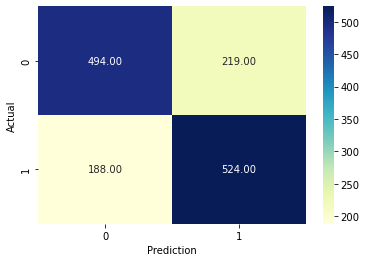

In [256]:
y_pred_train_logi=classifier.predict(X_train)
y_pred_logi= classifier.predict(X_test)
logi_R1=accuracy_score(y_train,y_pred_train_logi) 
logi_R2=accuracy_score(y_test,y_pred_logi)
logi_rmse=np.sqrt(mean_squared_error(y_test,y_pred_logi))
f1_logi=metrics.f1_score(y_test,y_pred_logi)
print("Training Accuracy = ",logi_R1)
print("Testing Accuracy = ",logi_R2)
print("F1 score = ",f1_logi)
print(classification_report(y_test,y_pred_logi))
print("Root Mean Squared Error = ",logi_rmse)
sns.heatmap(confusion_matrix(y_test,y_pred_logi), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

## Neural Network 

In [264]:
# create model
model = Sequential()
model.add(Dense(12, input_dim=12,  activation='relu'))
model.add(Dense(8,  activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [265]:
## Compile Model
model.compile(loss='binary_crossentropy',optimizer="adam",metrics=['accuracy'])

In [266]:
model.fit(X_train,y_train,epochs=1500,batch_size=10)

Epoch 1/1500
428/428 [==============================] - 1s 662us/step - loss: 2.2894 - accuracy: 0.5443
Epoch 2/1500
428/428 [==============================] - 0s 623us/step - loss: 0.7827 - accuracy: 0.5993
Epoch 3/1500
428/428 [==============================] - 0s 679us/step - loss: 0.6733 - accuracy: 0.6407
Epoch 4/1500
428/428 [==============================] - 0s 613us/step - loss: 0.7013 - accuracy: 0.6232
Epoch 5/1500
428/428 [==============================] - 0s 616us/step - loss: 0.6290 - accuracy: 0.6627
Epoch 6/1500
428/428 [==============================] - 0s 679us/step - loss: 0.6441 - accuracy: 0.6533
Epoch 7/1500
428/428 [==============================] - 0s 611us/step - loss: 0.6281 - accuracy: 0.6816
Epoch 8/1500
428/428 [==============================] - 0s 661us/step - loss: 0.6059 - accuracy: 0.6863
Epoch 9/1500
428/428 [==============================] - 0s 639us/step - loss: 0.6017 - accuracy: 0.6863
Epoch 10/1500
428/428 [==============================] - 0s 609u

45/45 [==============================] - 0s 965us/step
Training Accuracy =  0.8374269005847953
Testing Accuracy =  0.8042105263157895
F1 score =  0.7962016070124178
              precision    recall  f1-score   support

           0       0.78      0.84      0.81       713
           1       0.83      0.77      0.80       712

    accuracy                           0.80      1425
   macro avg       0.81      0.80      0.80      1425
weighted avg       0.81      0.80      0.80      1425



Text(33.0, 0.5, 'Actual')

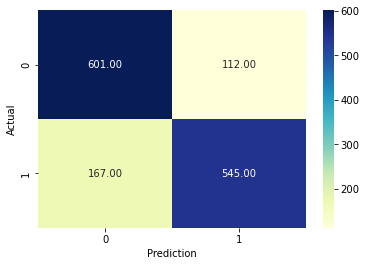

In [267]:
y_train_predicted = model.predict(X_train) > 0.5
y_predicted = model.predict(X_test) > 0.5
nn_R1=accuracy_score(y_train,y_train_predicted) 
nn_R2=accuracy_score(y_test,y_predicted)
print("Training Accuracy = ",nn_R1)
print("Testing Accuracy = ",nn_R2)
f1_nn=metrics.f1_score(y_test,y_predicted)
print("F1 score = ",f1_nn)
nn_rmse=np.sqrt(mean_squared_error(y_test,y_predicted))
print(classification_report(y_test,y_predicted))
sns.heatmap(confusion_matrix(y_test,y_predicted), annot=True, fmt='.2f', cmap='YlGnBu')
plt.xlabel('Prediction')
plt.ylabel('Actual')

# Accuracy of models

In [268]:
Result=pd.DataFrame({"Model":["Random Forest","KNN_model","Bagging_model","Ada_model","model_tree","model_xgb","Logistic Regression","Neural Network "],"Training_Accuracy":[rf_R1,KNN_R1,bm_R1,ada_R1,dt_R1,xgb_R1,logi_R1,nn_R1],"Testing_Accuracy":[rf_R2,KNN_R2,bm_R2,ada_R2,dt_R2,xgb_R2,logi_R2,nn_R2],"RMSE":[rf_rmse,KNN_rmse,bm_rmse,ada_rmse,dt_rmse,xgb_rmse,logi_rmse,nn_rmse],"F1 Score":[f1_rf,f1_knn,f1_bm,f1_ada,f1_dt,f1_xgb,f1_logi,f1_nn]})

In [269]:
Result

,Model,Training_Accuracy,Testing_Accuracy,RMSE,F1 Score
0,Random Forest,0.910877,0.888421,0.334034,0.878533
1,KNN_model,0.990643,0.899649,0.316782,0.904220
2,Bagging_model,0.908538,0.895439,0.323360,0.888390
3,Ada_model,0.942690,0.938246,0.248504,0.937322
4,model_tree,0.928655,0.920702,0.281599,0.915101
5,model_xgb,1.000000,0.984561,0.124252,0.984308
6,Logistic Regression,0.716491,0.714386,0.534429,0.720275
7,Neural Network,0.837427,0.804211,0.442481,0.796202


# Receiver Operating Characteristic (ROC)

### Prediction probabilities

In [270]:
r_probs = [0 for _ in range(len(y_test))] # Probabilities for the positive outcome is kept.
rf_probs=rf_model.predict_proba(X_test)
knn_probs=KNN_model1.predict_proba(X_test)
bgg_probs=Bagging_model.predict_proba(X_test)
ada_probs=Ada_model.predict_proba(X_test)
dt_probs=model_tree.predict_proba(X_test)
xgb_probs=model_xgb.predict_proba(X_test)
logi_probs=classifier.predict_proba(X_test)

In [271]:
rf_probs = rf_probs[:, 1]
knn_probs = knn_probs[:, 1]
bgg_probs = bgg_probs[:, 1]
ada_probs = ada_probs[:, 1]
dt_probs = dt_probs[:, 1]
xgb_probs = xgb_probs[:, 1]
logi_probs = logi_probs[:, 1]

## Computing AUROC and ROC curve values

### Calculate AUROC
#### ROC is the receiver operating characteristic AUROC is the area under the ROC curve

In [272]:
r_auc = roc_auc_score(y_test, r_probs)
rf_auc = roc_auc_score(y_test, rf_probs)
knn_auc = roc_auc_score(y_test, knn_probs)
bgg_auc = roc_auc_score(y_test, bgg_probs)
ada_auc = roc_auc_score(y_test, ada_probs)
dt_auc = roc_auc_score(y_test, dt_probs)
xgb_auc = roc_auc_score(y_test, xgb_probs)
logi_auc = roc_auc_score(y_test, logi_probs)

### Calculate ROC curve

In [273]:
r_fpr, r_tpr, _ = roc_curve(y_test, r_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
knn_fpr, knn_tpr, _ = roc_curve(y_test, knn_probs)
bgg_fpr, bgg_tpr, _= roc_curve(y_test, bgg_probs)
ada_fpr, ada_tpr, _=roc_curve(y_test, ada_probs)
dt_fpr, dt_tpr, _= roc_curve(y_test, dt_probs)
xgb_fpr, xgb_tpr, _=roc_curve(y_test, xgb_probs)
logi_fpr, logi_tpr, _=roc_curve(y_test, logi_probs)

#### Plot the ROC curve

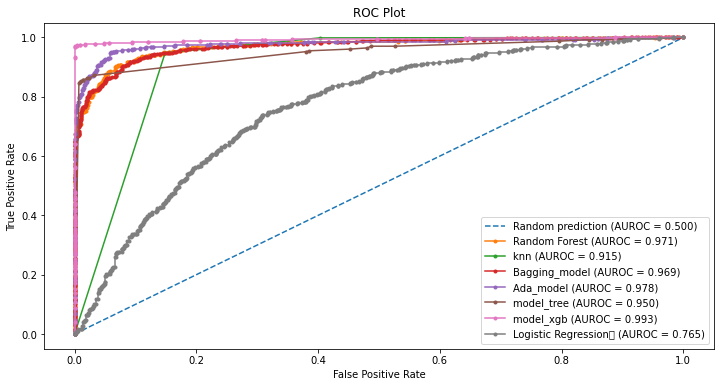

In [274]:
fig = plt.figure(figsize=(12,6))

plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(rf_fpr, rf_tpr, marker='.', label='Random Forest (AUROC = %0.3f)' % rf_auc)
plt.plot(knn_fpr, knn_tpr, marker='.', label='knn (AUROC = %0.3f)' % knn_auc)
plt.plot(bgg_fpr, bgg_tpr, marker='.', label='Bagging_model (AUROC = %0.3f)' % bgg_auc)
plt.plot(ada_fpr, ada_tpr, marker='.', label='Ada_model (AUROC = %0.3f)' % ada_auc)
plt.plot(dt_fpr, dt_tpr, marker='.', label='model_tree (AUROC = %0.3f)' % dt_auc)
plt.plot(xgb_fpr, xgb_tpr, marker='.', label='model_xgb (AUROC = %0.3f)' % xgb_auc)
plt.plot(logi_fpr, logi_tpr, marker='.', label='Logistic Regression	 (AUROC = %0.3f)' % logi_auc)

# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()

# pickle file

In [275]:
import pickle

In [276]:
pickle_out=open('model_xgb.pkl','wb')
pickle.dump(model_xgb,pickle_out)
pickle_out.close()

In [277]:
pickle_in = open('model_xgb.pkl', 'rb') 
model = pickle.load(pickle_in)